# Computation of quality metrics for the glioblastoma test dataset and generation of Figure 8.

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import anndata as ad
from adjustText import adjust_text

In [3]:
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(20, 15))
sc.settings.verbosity = 3

-----
anndata     0.10.8
scanpy      1.10.1
-----
PIL                         10.2.0
anyio                       NA
arrow                       1.3.0
asciitree                   NA
asttokens                   NA
astunparse                  1.6.3
attr                        23.1.0
attrs                       23.1.0
babel                       2.11.0
bottleneck                  1.3.7
brotli                      1.0.9
certifi                     2024.08.30
cffi                        1.16.0
charset_normalizer          2.0.4
cloudpickle                 3.0.0
colorama                    0.4.6
comm                        0.2.1
cycler                      0.10.0
cython_runtime              NA
dask                        2024.7.0
dateutil                    2.8.2
debugpy                     1.6.7
decorator                   5.1.1
defusedxml                  0.7.1
executing                   0.8.3
fastjsonschema              NA
fqdn                        NA
h5py                        3.9.0
id

#### I imported the complete GBM dataset (including both healthy and non-healthy cells) and computed quality metrics.

In [4]:
adata = sc.read_h5ad('/hpc/hers_basak/rnaseq_data/Silettilab/icoratella/final_useful_datasets/GBM_202406_with_UMAP.h5ad')

In [29]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')

sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], inplace=True)

print(np.median(adata.obs['TotalUMIs']))
print(np.median(adata.obs['pct_counts_mt']))

11049.0
0.0


#### I reannotated the GBM dataset based on the previously existing manual annotation.

In [7]:
mapping_dict = {
    "Astrocytes (protplasmic)": "Astrocytes",
    "Astrocytes?": "Astrocytes",
    "B-cells, Plasma (more right part)": "B cells",
    "Endothelial": "Endothelial cells",
    "Immune": "Immune cells",
    "Immune?": "Immune cells",
    "MAC(microglia?)": "Immune cells",
    "MAC": "Immune cells",
    "MAC + bottom right DC": "Immune cells",
    "Monocyte": "Immune cells",
    "Microglia, top part DC?": "Immune cells",
    "T-cell, NK-cell (vertical middle stripe)": "T-NK cells",
    "MAC + monocyte (+ small dot mast cells bottom right)": "Immune cells",
    "Microglia, MAC, top separate cluster DC?": "Immune cells",
    "Mast-cells": "Immune cells",
    "Microglia?": "Immune cells",
    "Oligo, astro, endothelial, microglia (multiplet)": "Multiplet",
    "Pericytes, VSMCs (more right part), fibroblasts top part.": "Vascular cells",
    "Tumor": "Tumor Cells",
    "Oligo": "Oligodendrocytes",
    "Neurons": "Neurons"
}

adata.obs['broader_labels'] = adata.obs['ManualAnnotation'].map(mapping_dict)

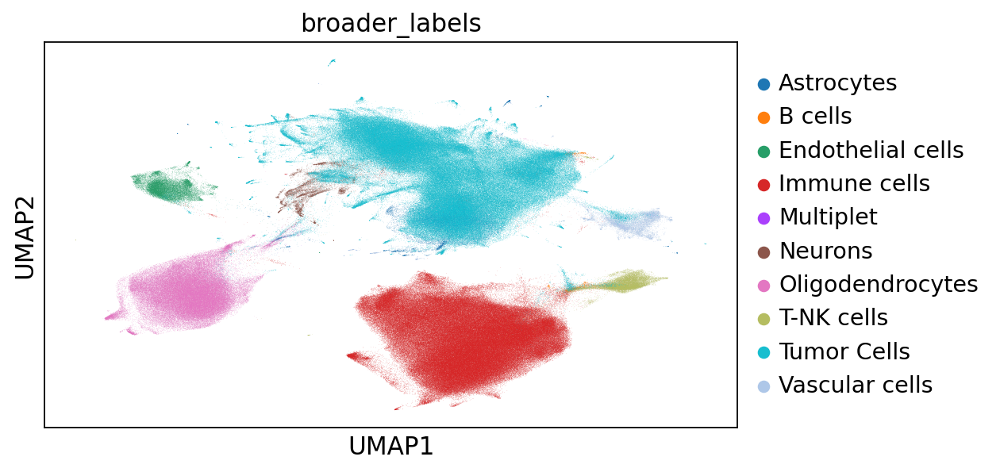

In [9]:
sc.pl.embedding(adata, basis = 'UMAP', color = 'broader_labels')

## Figure 8

In [36]:
personalized_palette = ["#58b5e1", "#823a5b", "#a2e67c", "#be3e20",  "#809b31", "#46ebdc",  "#c6c0fe", "#553096", "#db11ac", "#44f270", "#f597fa", "#276cb6", "#e9bf98", "#8138fc", "#fe8c65", "#12982d", "#ff1c5d", "#ead624", "#985c26", "#f3c5fa", "#294d46"]

#### PANEL A

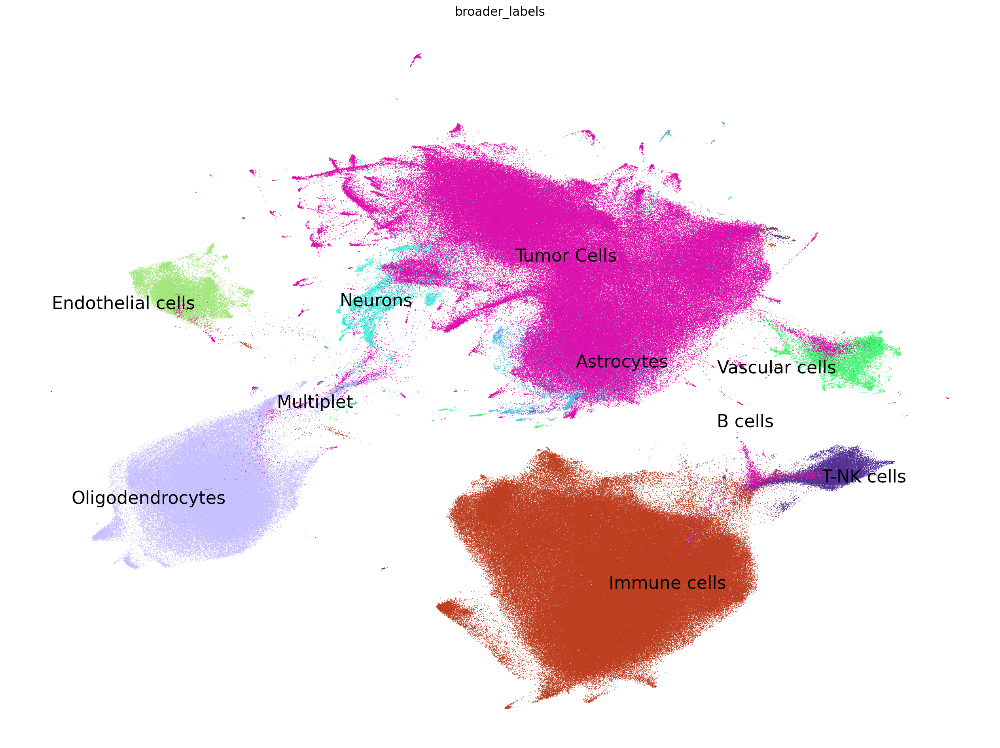

In [39]:
fig = sc.pl.embedding(
    adata,
    basis='UMAP',
    color='broader_labels',
    palette=personalized_palette,
    size=3,
    alpha=1,
    legend_loc='none',
    frameon=False,
    show=False,
    return_fig=True
)
ax = fig.axes[0]

cluster_labels = adata.obs['broader_labels'].unique()
texts = []
for cluster in cluster_labels:
    sel = adata.obs['broader_labels'] == cluster
    
    if np.any(sel):
        coords = adata.obsm['UMAP'][sel, :]
        mean_x = np.mean(coords[:, 0])
        mean_y = np.mean(coords[:, 1])
        
        txt = ax.text(
            mean_x, mean_y, 
            cluster, 
            fontsize=20,
            ha='center',
            va='center',
            bbox=dict(facecolor='none', alpha=0.8, edgecolor='none')
        )
        texts.append(txt)

adjust_text(
    texts,
    ax=ax,
    arrowprops=dict(arrowstyle='->', color='gray', lw=0.5)
)

plt.show()
# uncomment this to save high quality figure
#plt.savefig('fig_8_panel_A.png', dpi = 600)

#### PANEL B

In [41]:
adata = sc.read_h5ad('/hpc/hers_basak/rnaseq_data/Silettilab/icoratella/final_useful_datasets/SL040_refined_with_umap.h5ad')

In [46]:
adata.obs['broader_labels'] = adata.obs['ManualAnnotation'].map(mapping_dict)

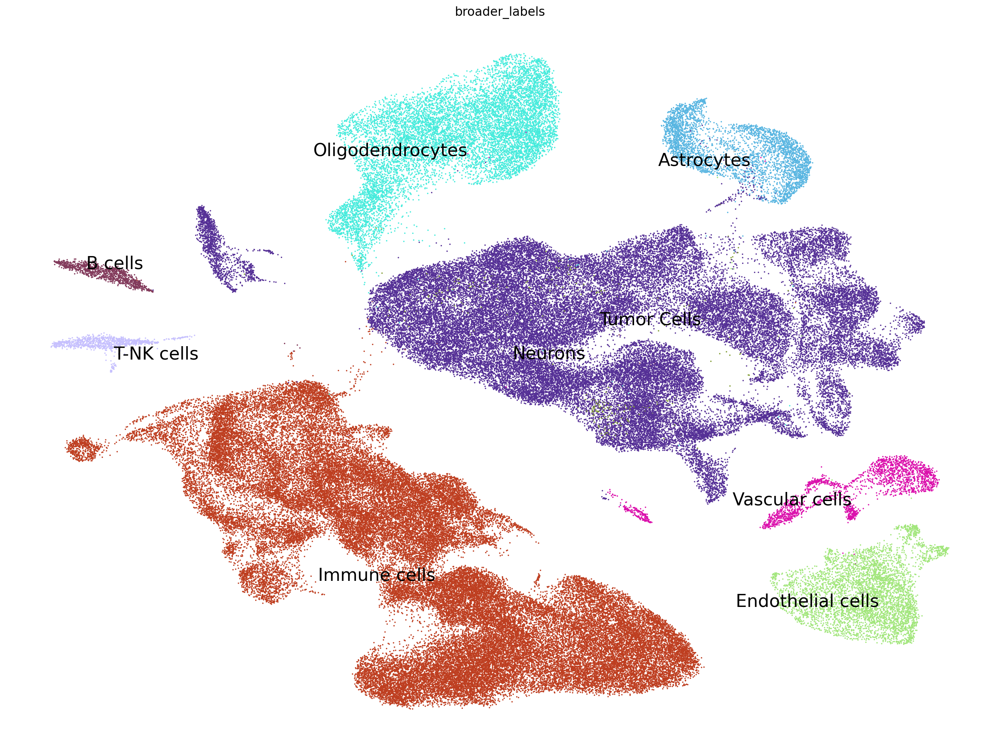

In [49]:
fig = sc.pl.embedding(
    adata,
    basis='X_umap',
    color='broader_labels',
    palette=personalized_palette,
    size=10,
    alpha=1,
    legend_loc='none',
    frameon=False,
    show=False,
    return_fig=True
)
ax = fig.axes[0]

cluster_labels = adata.obs['broader_labels'].unique()
texts = []
for cluster in cluster_labels:
    sel = adata.obs['broader_labels'] == cluster
    
    if np.any(sel):
        coords = adata.obsm['X_umap'][sel, :]
        mean_x = np.mean(coords[:, 0])
        mean_y = np.mean(coords[:, 1])
        
        txt = ax.text(
            mean_x, mean_y, 
            cluster, 
            fontsize=20,
            ha='center',
            va='center',
            bbox=dict(facecolor='none', alpha=1, edgecolor='none')
        )
        texts.append(txt)

adjust_text(
    texts,
    ax=ax,
    arrowprops=dict(arrowstyle='->', color='gray', lw=0.5)
)

plt.show()
# uncomment this to save high quality figure
#plt.savefig('fig_8_panel_B.png', dpi = 600)

## PANEL C

In [61]:
adata = sc.read_h5ad('/hpc/hers_basak/rnaseq_data/Silettilab/icoratella/final_useful_datasets/testSL051_refinedUmap.h5ad')

In [62]:
adata.obs['broader_labels'] = adata.obs['ManualAnnotation'].map(mapping_dict)

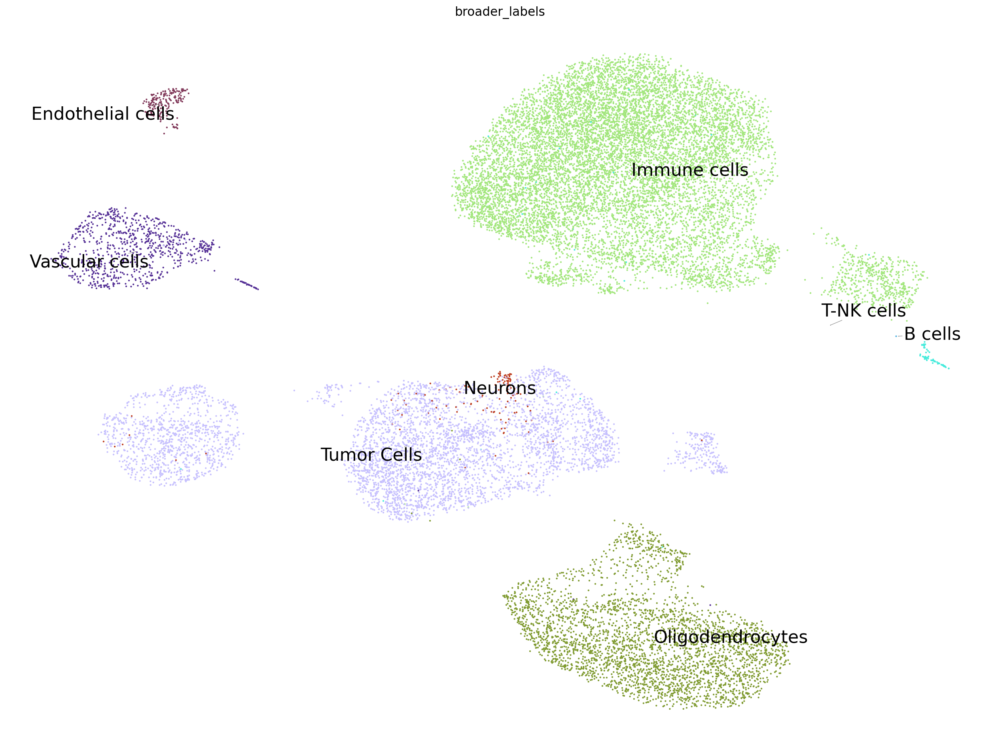

In [63]:
fig = sc.pl.embedding(
    adata,
    basis='X_umap',
    color='broader_labels',
    palette=personalized_palette,
    size=15,
    alpha=1,
    legend_loc='none',
    frameon=False,
    show=False,
    return_fig=True
)
ax = fig.axes[0]

cluster_labels = adata.obs['broader_labels'].unique()
texts = []
for cluster in cluster_labels:
    sel = adata.obs['broader_labels'] == cluster
    
    if np.any(sel):
        coords = adata.obsm['X_umap'][sel, :]
        mean_x = np.mean(coords[:, 0])
        mean_y = np.mean(coords[:, 1])
        
        txt = ax.text(
            mean_x, mean_y, 
            cluster, 
            fontsize=20,
            ha='center',
            va='center',
            bbox=dict(facecolor='none', alpha=0.8, edgecolor='none')
        )
        texts.append(txt)

adjust_text(
    texts,
    ax=ax,
    arrowprops=dict(arrowstyle='->', color='gray', lw=0.5)
)

plt.show()
# uncomment this to save high quality figure
#plt.savefig('fig_8_panel_C.png', dpi = 600)

# PANEL D

In [64]:
adata = sc.read_h5ad('/hpc/hers_basak/rnaseq_data/Silettilab/icoratella/final_useful_datasets/testSL052_refinedUmap.h5ad')

In [65]:
adata.obs['broader_labels'] = adata.obs['ManualAnnotation'].map(mapping_dict)

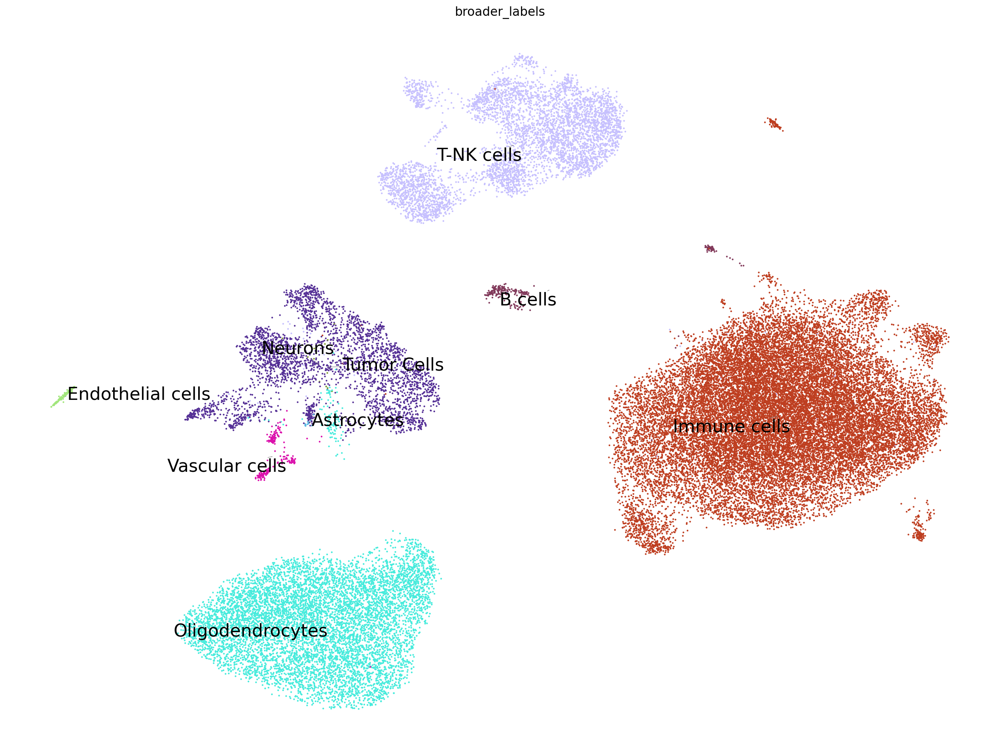

In [66]:
fig = sc.pl.embedding(
    adata,
    basis='X_umap',
    color='broader_labels',
    palette=personalized_palette,
    size=15,
    alpha=1,
    legend_loc='none',
    frameon=False,
    show=False,
    return_fig=True
)
ax = fig.axes[0]

cluster_labels = adata.obs['broader_labels'].unique()
texts = []
for cluster in cluster_labels:
    sel = adata.obs['broader_labels'] == cluster
    
    if np.any(sel):
        coords = adata.obsm['X_umap'][sel, :]
        mean_x = np.mean(coords[:, 0])
        mean_y = np.mean(coords[:, 1])
        
        txt = ax.text(
            mean_x, mean_y, 
            cluster, 
            fontsize=20,
            ha='center',
            va='center',
            bbox=dict(facecolor='none', alpha=0.8, edgecolor='none')
        )
        texts.append(txt)

adjust_text(
    texts,
    ax=ax,
    arrowprops=dict(arrowstyle='->', color='gray', lw=0.5)
)

plt.show()
# uncomment this to save high quality figure
#plt.savefig('fig_8_panel_D.png', dpi = 600)